# Setup

In [1]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [2]:
import scvi
import scrnatools as rna
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import celltypist
import os
import shutil
import anndata as ad
import scanpy as sc

In [3]:
# Setup seeds
scvi.settings.seed = 0

Global seed set to 0


In [4]:
# Setup figure params
plt.rcParams["pdf.use14corefonts"] = True
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = "Arial"
sc.set_figure_params(dpi=80, dpi_save=300, facecolor="white", frameon=False)
sns.set_context("paper")
plt.rcParams["axes.grid"] = False
cmap = sns.color_palette("colorblind")
# Get the tab20 colormap
tab20_cmap = plt.get_cmap('tab20')

# Create a new colormap without the 7th and 8th colors
colors_to_exclude = [6, 7]  # 0-based index, so 6 and 7 represent the 7th and 8th colors
new_tab20 = [tab20_cmap(i) for i in range(tab20_cmap.N) if i not in colors_to_exclude]

In [5]:
warnings.resetwarnings()

## Set data paths

### demeter

In [6]:
rawDataPath = "/mnt/iacchus/joe/raw_data/"
processedDataPath = "/mnt/iacchus/joe/processed_data/"

# Import raw data

## Aire KO 1

In [8]:
aire_WT_1 = sc.read_h5ad(
    f"{rawDataPath}/Thymus/Yi/kallisto/Aire_WT-1/counts_unfiltered/adata.h5ad",
)

In [9]:
aire_KO_1 = sc.read_h5ad(
    f"{rawDataPath}/Thymus/Yi/kallisto/Aire_KO-1/counts_unfiltered/adata.h5ad",
)

## Aire KO 2

In [10]:
aire_WT_2 = sc.read_h5ad(
    f"{rawDataPath}/Thymus/Aire_KO/kallisto/Aire_WT-2/counts_unfiltered/adata.h5ad",
)

In [11]:
aire_KO_2 = sc.read_h5ad(
    f"{rawDataPath}/Thymus/Aire_KO/kallisto/Aire_KO-2/counts_unfiltered/adata.h5ad",
)

In [12]:
aire = ad.concat(
    [aire_WT_1, aire_KO_1, aire_WT_2, aire_KO_2,],
    label="batch",
    index_unique="-",
    keys=["Aire_WT-1", "Aire_KO-1", "Aire_WT-2", "Aire_KO-2"],   
)
aire.layers["raw_counts"] = aire.X.copy()
aire.obs["genotype"] = [i.rsplit("-", 1)[0] for i in aire.obs.batch]
aire.obs["genotype"] = [i.split("_")[1] if "WT" in i else i for i in aire.obs.genotype]
aire.obs["sample"] = [i.rsplit("-", 1)[1] for i in aire.obs.batch]

## Fezf2 KO 1

In [13]:
fezf2_WT_1 = sc.read_h5ad(
    f"{rawDataPath}/Thymus/Fezf2_KO/kallisto/Fezf2_WT-1/counts_unfiltered/adata.h5ad",
)

In [14]:
fezf2_KO_1 = sc.read_h5ad(
    f"{rawDataPath}/Thymus/Fezf2_KO/kallisto/Fezf2_KO-1/counts_unfiltered/adata.h5ad",
)

## Fezf2 KO 2

In [15]:
fezf2_WT_2 = sc.read_h5ad(
    f"{rawDataPath}/Thymus/Fezf2_KO/kallisto/Fezf2_WT-2/counts_unfiltered/adata.h5ad",
)

In [16]:
fezf2_KO_2 = sc.read_h5ad(
    f"{rawDataPath}/Thymus/Fezf2_KO/kallisto/Fezf2_KO-2/counts_unfiltered/adata.h5ad",
)

In [17]:
fezf2 = ad.concat(
    [fezf2_WT_1, fezf2_KO_1, fezf2_WT_2, fezf2_KO_2,],
    label="batch",
    index_unique="-",
    keys=["Fezf2_WT-1", "Fezf2_KO-1", "Fezf2_WT-2", "Fezf2_KO-2"],   
)
fezf2.layers["raw_counts"] = fezf2.X.copy()
fezf2.obs["genotype"] = [i.rsplit("-", 1)[0] for i in fezf2.obs.batch]
fezf2.obs["genotype"] = [i.split("_")[1] if "WT" in i else i for i in fezf2.obs.genotype]
fezf2.obs["sample"] = [i.rsplit("-", 1)[1] for i in fezf2.obs.batch]

In [18]:
adatas = {"aire": aire, "fezf2": fezf2}

# Preprocessing

In [19]:
for key,adata in adatas.items():
    print(key)
    # Get biomart gene annotations
    adata.var["ensembl_gene"] = [i.split(".")[0] for i in adata.var_names]
    gene_info = sc.queries.biomart_annotations("mmusculus", ["ensembl_gene_id", "external_gene_name", "gene_biotype"])
    gene_info.index = gene_info.ensembl_gene_id
    gene_info = gene_info[gene_info.index.isin(adata.var.ensembl_gene)]
    gene_info = gene_info.drop_duplicates(subset="external_gene_name")
    adata = adata[:, adata.var.ensembl_gene.isin(gene_info.index)].copy()
    adata.var = adata.var.join(gene_info, on="ensembl_gene")
    # Drop transcripts with no gene name
    adata = adata[:, ~adata.var.external_gene_name.isna()].copy()
    # Annotate mito genes
    adata.var["mt"] = adata.var.external_gene_name.str.startswith("mt-")
    # Get qc metrics for each cell, gene
    sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True, percent_top=None, log1p=False,)
    # Subset on protein coding genes
    adata = adata[:, adata.var.gene_biotype.isin(["protein_coding"])].copy()
    # Basic prefiltering of lowly detected genes/empty droplets
    sc.pp.filter_genes(adata, min_cells=20)
    sc.pp.filter_cells(adata, min_genes=100)
    adata.var.index = adata.var.external_gene_name
    
    adatas[key] = adata
    
all_merged = ad.concat([adatas["aire"], adatas["fezf2"]], index_unique="-",)
for key,adata in adatas.items():
    # Subset on shared genes between samples
    adata = adata[:, adata.var_names.isin(all_merged.var_names)].copy()
    adatas[key] = adata

aire
fezf2


In [20]:
for key,adata in adatas.items():
    print(key)
    print(adata.shape)
    print(adata.obs.genotype.value_counts())

aire
(226662, 19238)
WT         124279
Aire_KO    102383
Name: genotype, dtype: int64
fezf2
(70953, 19238)
Fezf2_KO    44936
WT          26017
Name: genotype, dtype: int64


# Scrublet doublet removal

aire
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.47
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.0%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 33.3%
Elapsed time: 191.6 seconds
Detected doublet rate = 3.4%
Estimated detectable doublet fraction = 16.0%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 21.3%
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.53
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.0%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 22.2%
Elapsed time: 42.3 seconds
Detected doublet rate = 0.2%
Estimated detectable doublet fraction = 1.5%
Overall doublet rate:
	Expected   = 6.0%
	Estimated  = 15.9%
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
C

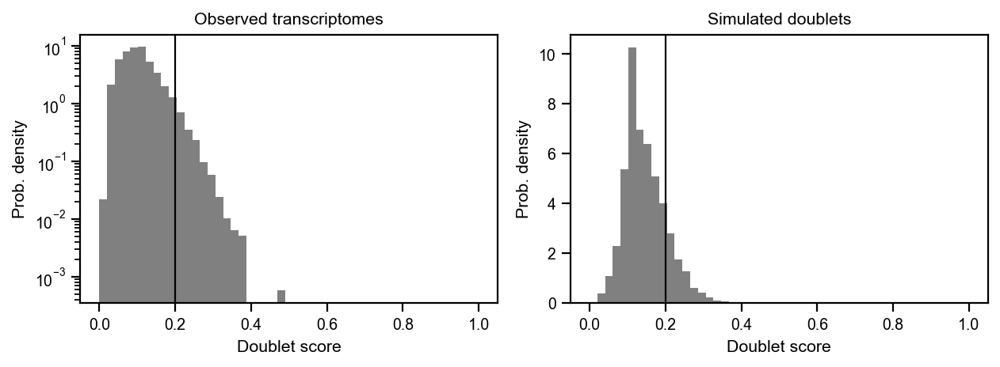

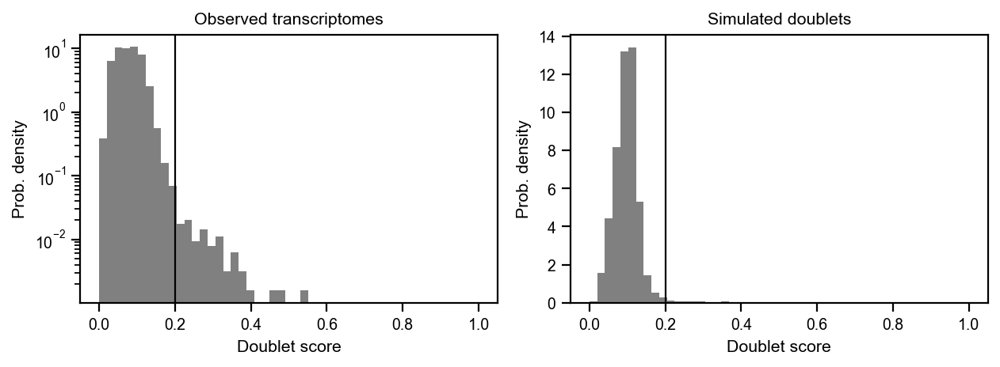

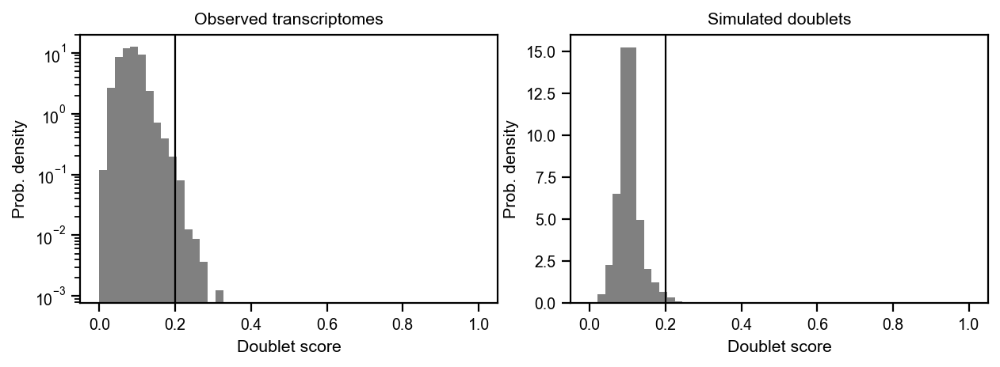

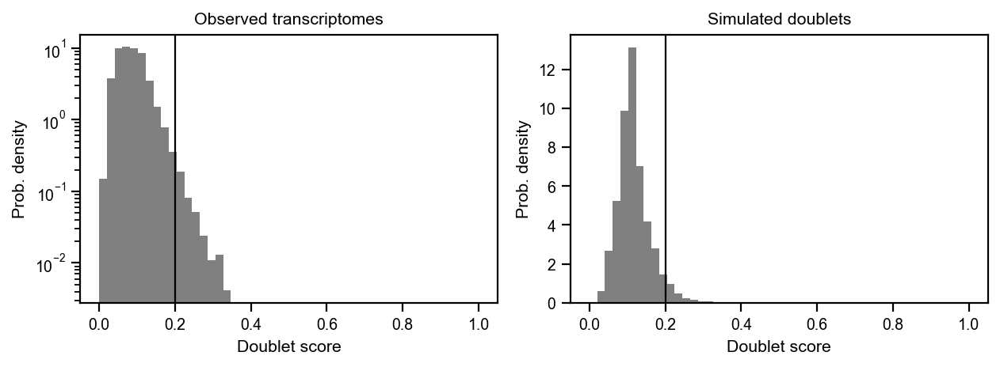

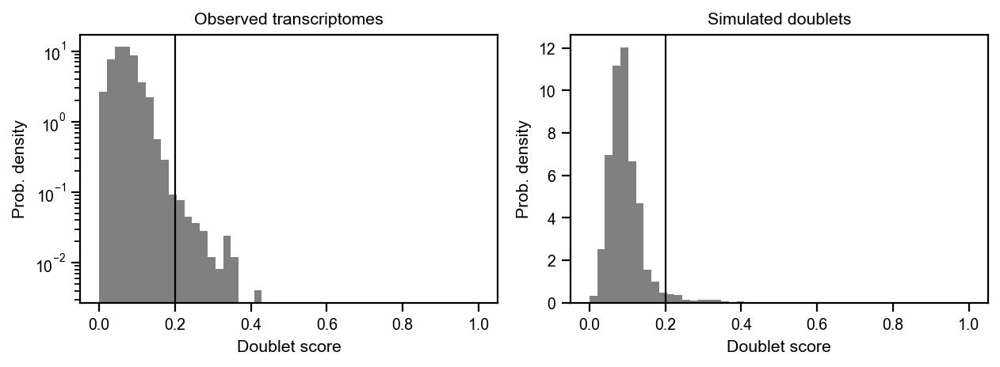

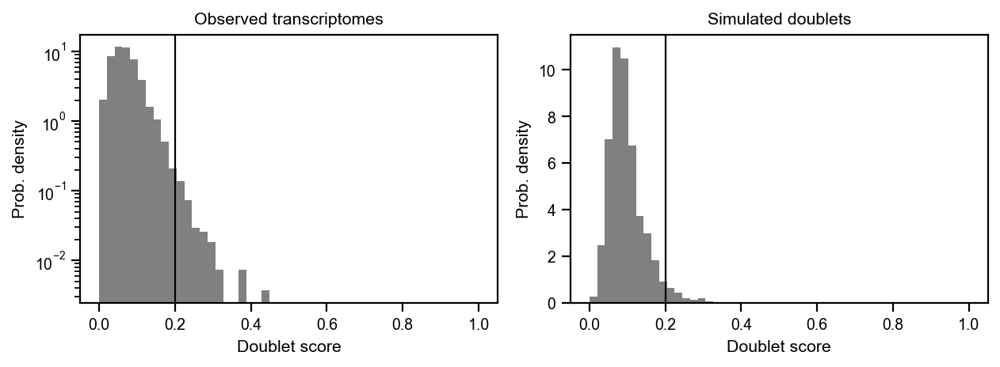

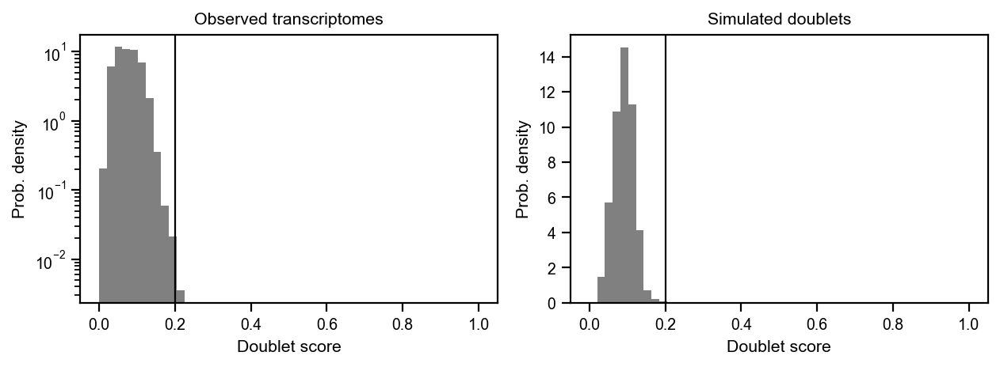

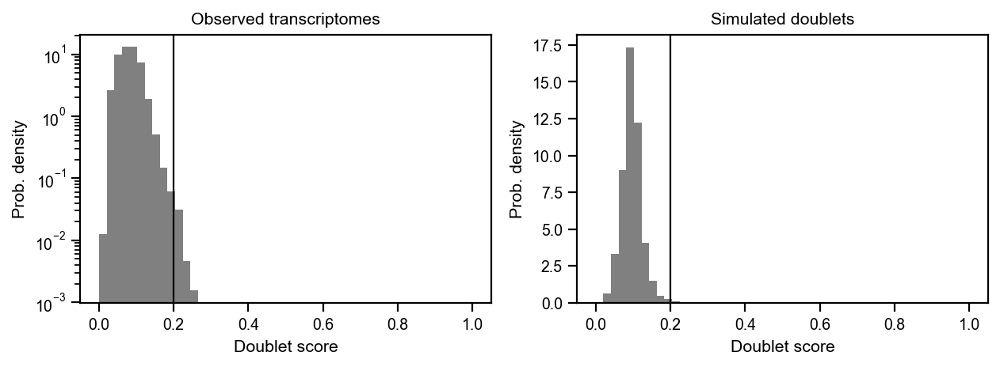

In [21]:
for key,adata in adatas.items():
    print(key)
    adata = rna.qc.scrublet(
        adata,
        doublet_threshold = 0.2,
        batch_key = "batch",
        raw_counts_layer = "raw_counts",
        subset=False,
    )
    adata = adata[~adata.obs.scrublet_called_doublet].copy()
    
    adatas[key] = adata

In [22]:
for key,adata in adatas.items():
    print(key)
    print(adata.shape)
    print(adata.obs.genotype.value_counts())

aire
(222953, 19238)
WT         121270
Aire_KO    101683
Name: genotype, dtype: int64
fezf2
(70776, 19238)
Fezf2_KO    44821
WT          25955
Name: genotype, dtype: int64


## QC filter

aire


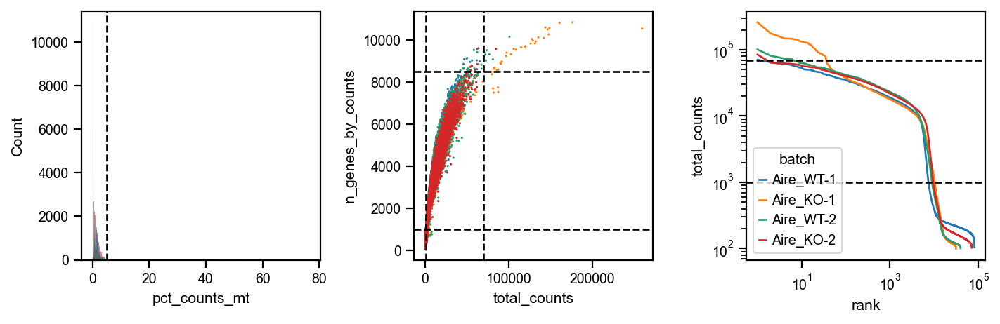

fezf2


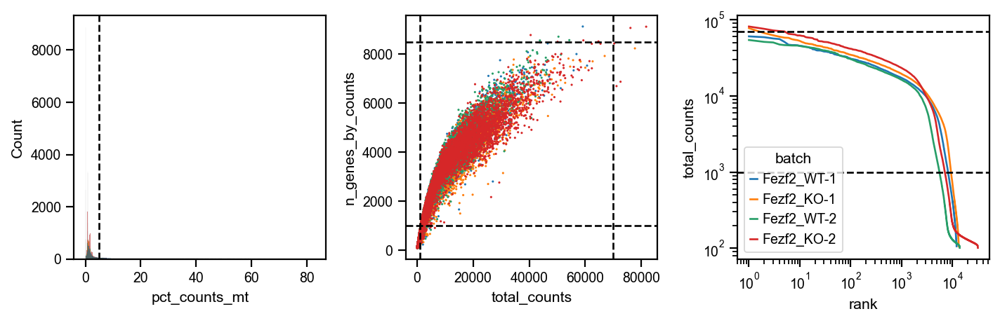

In [23]:
for key,adata in adatas.items():
    print(key)
    # Set thresholds
    countsThreshold = [1000, 70000]
    genesThreshold = [1000, 8500]
    mtThreshold = 5
    # Check QC thresholds before filtering
    rna.pl.qc_plotting(
        adata,
        batch_key="batch",
        counts_thresholds=countsThreshold,
        genes_thresholds=genesThreshold,
        mt_threshold=mtThreshold,
    )

aire


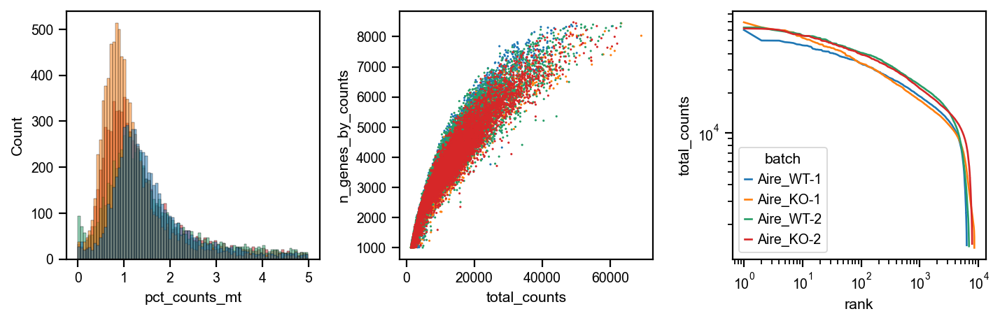

fezf2


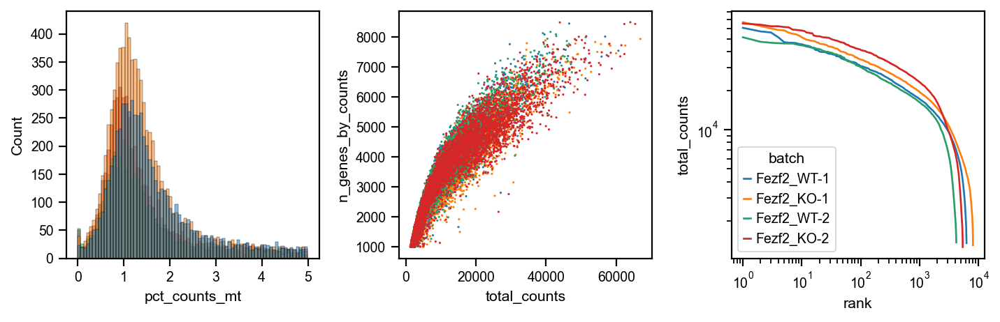

In [24]:
for key,adata in adatas.items():
    print(key)
    filteredAdata = rna.qc.filter_cells(
        adata,
        counts_thresholds=countsThreshold, 
        genes_thresholds=genesThreshold, 
        mt_threshold=mtThreshold,
    )
    rna.pl.qc_plotting(
        filteredAdata,
        show_thresholds=False,
        batch_key="batch",
    )
    
    adatas[key] = filteredAdata

In [25]:
for key,adata in adatas.items():
    print(key)
    print(adata.shape)
    print(adata.obs.genotype.value_counts())

aire
(29670, 19238)
Aire_KO    16400
WT         13270
Name: genotype, dtype: int64
fezf2
(23890, 19238)
Fezf2_KO    13433
WT          10457
Name: genotype, dtype: int64


## Normalize data (scanpy)

In [26]:
for key,adata in adatas.items():
    print(key)
    # Scanpy preprocessing pipeline
    adata.raw = adata
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    adata.layers["log1p"] = adata.X.copy()
    
    adatas[key] = adata

aire
fezf2


# scVI training

In [27]:
if not os.path.isdir(f"{processedDataPath}/Fezf2_thymus_paper/h5ad_files/pairwise_processing"):
    os.makedirs(f"{processedDataPath}/Fezf2_thymus_paper/h5ad_files/pairwise_processing")

... storing 'genotype' as categorical
... storing 'sample' as categorical
... storing 'gene_biotype' as categorical
... storing 'gene_biotype' as categorical


aire


Unable to initialize backend 'rocm': NOT_FOUND: Could not find registered platform with name: "rocm". Available platform names are: CUDA
Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 195/1000:  20%|█▉        | 195/1000 [19:03<1:18:41,  5.87s/it, v_num=1, train_loss_step=1.12e+4, train_loss_epoch=1.03e+4]
Monitored metric elbo_validation did not improve in the last 45 records. Best score: 10370.546. Signaling Trainer to stop.


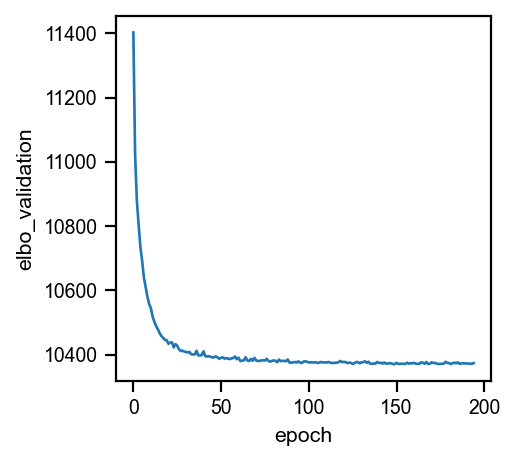

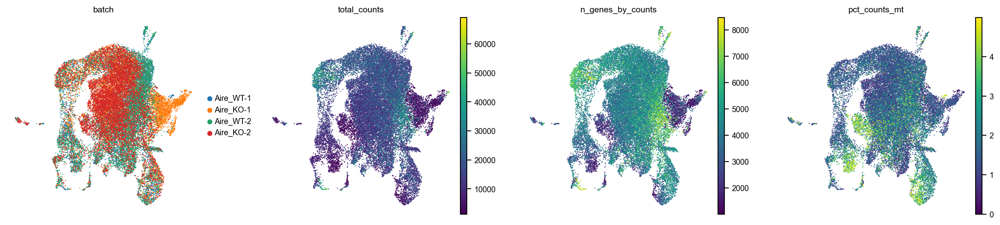

... storing 'genotype' as categorical
... storing 'sample' as categorical
... storing 'gene_biotype' as categorical
... storing 'gene_biotype' as categorical


fezf2


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 212/1000:  21%|██        | 212/1000 [16:31<1:01:23,  4.67s/it, v_num=1, train_loss_step=9.34e+3, train_loss_epoch=9.38e+3]
Monitored metric elbo_validation did not improve in the last 45 records. Best score: 9458.356. Signaling Trainer to stop.


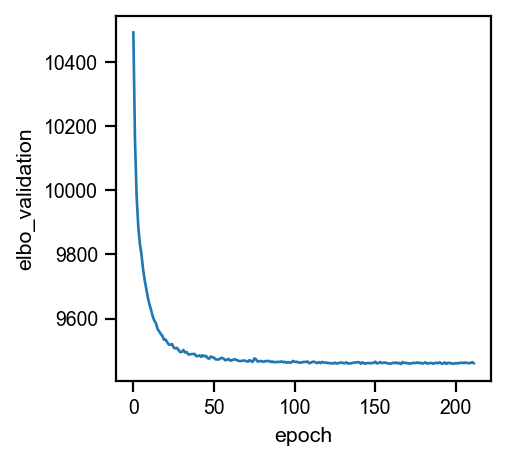

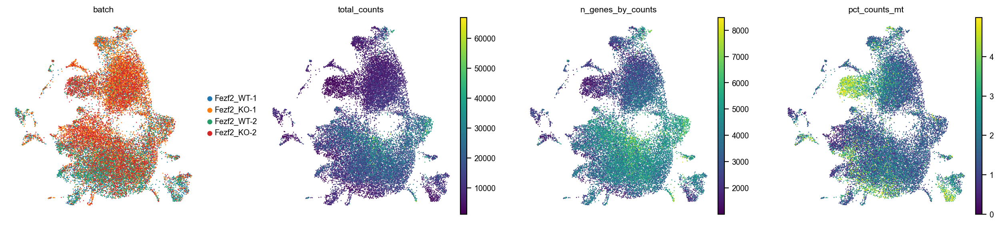

In [28]:
models = {}
for key,adata in adatas.items():
    print(key)
    adata.write(f"{processedDataPath}/Fezf2_thymus_paper/h5ad_files/pairwise_processing/{key}_unintegrated.h5ad")
    # Setup scVI model using raw counts and batch info
    scvi.model.SCVI.setup_anndata(
        adata,
        layer="raw_counts",
        batch_key="batch",
    )
    model = scvi.model.SCVI(adata)
    
    # Train scVI model
    model.train(
        early_stopping=True,
        max_epochs=1000,
        accelerator="gpu",
        devices="auto" 
    )
    
    # Plot model ELBO
    plt.figure(figsize=(3,3))
    ax = sns.lineplot(model.history['elbo_validation'])
    plt.ylabel("elbo_validation")
    ax.get_legend().remove()
    plt.show()
    
    # get scVI latent space and normalized expression
    adata.obsm["X_scVI"] = model.get_latent_representation()
    adata.layers["scVI_normalized"] = model.get_normalized_expression(library_size=1e4)
    
    # Dimensionality reduction
    sc.pp.neighbors(adata, use_rep="X_scVI")
    sc.tl.umap(adata)
    
    sc.pl.umap(
        adata,
        color=["batch", "total_counts", "n_genes_by_counts", "pct_counts_mt"],
        s=5,
    )
    
    adatas[key] = adata
    models[key] = model

# Clustering

aire


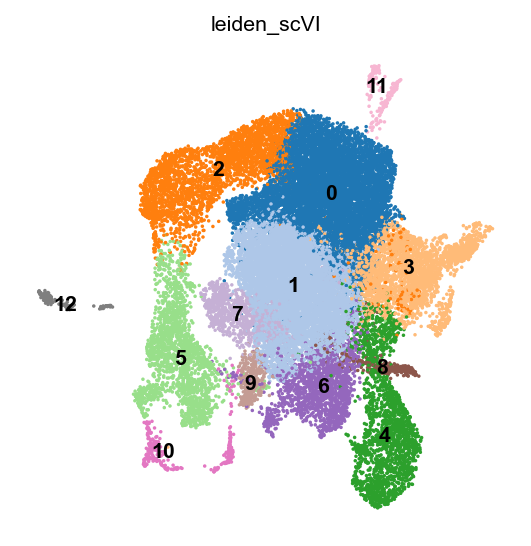

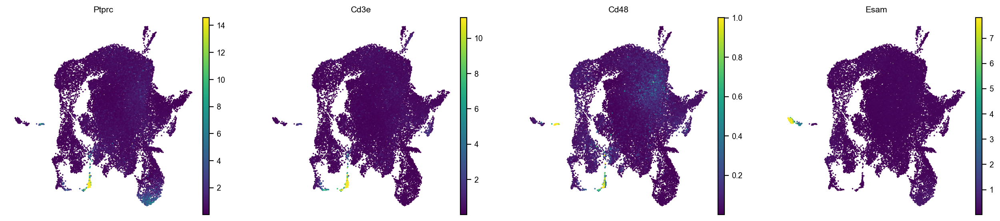

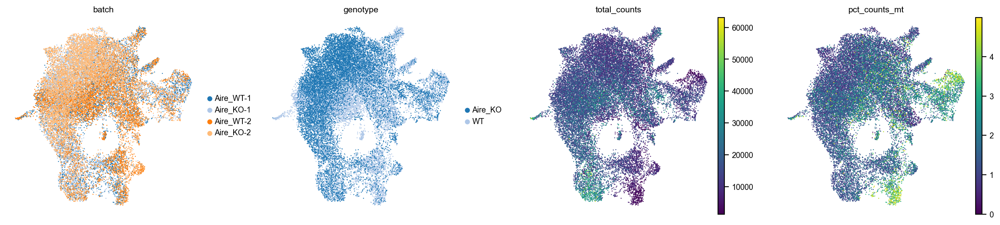

fezf2


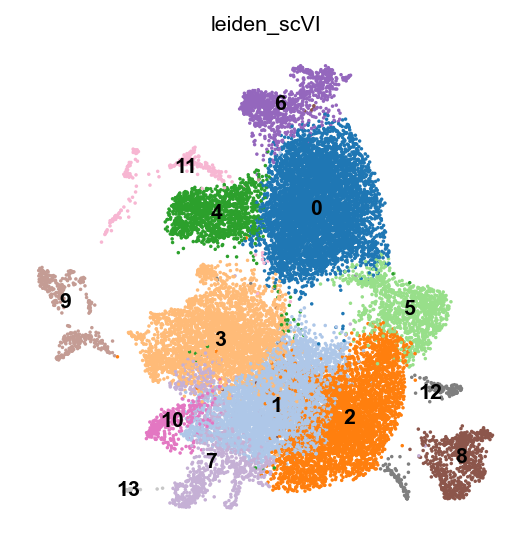

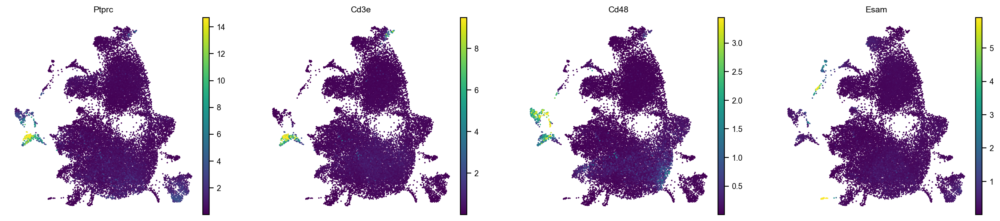

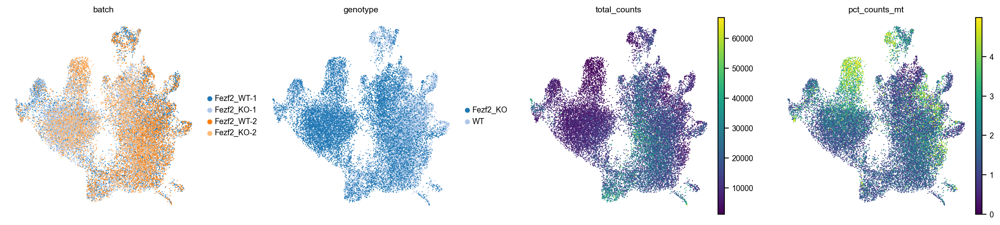

In [32]:
filteredAdatas = {}
clusters_to_filter = {"aire": ["12", "10", "3", "7"], "fezf2": ["9", "11", "13"]}
resolutions={"aire": 0.4, "fezf2": 0.5}
for key,adata in adatas.items():
    print(key)
    sc.tl.leiden(adata, key_added="leiden_scVI", resolution=resolutions[key])
    
    sc.pl.umap(
        adata,
        color=["leiden_scVI"],
        legend_loc="on data",
        palette=new_tab20,
        s=10,
    )
    
    geneList = ["Ptprc", "Cd3e", "Cd48", "Esam"]
    rna.pl.gene_embedding(
        adata,
        gene_list=geneList,
        layer="scVI_normalized",
        cmap="viridis",
        s=10,
        min_quantile=0.001,
        max_quantile=0.999,
    )
    
    filteredAdata = adata[~adata.obs.leiden_scVI.isin(clusters_to_filter[key])].copy()
    
    # Dimensionality reduction
    sc.pp.neighbors(filteredAdata, use_rep="X_scVI")
    sc.tl.umap(filteredAdata)
    sc.pl.umap(
        filteredAdata,
        palette=new_tab20,
        color=["batch", "genotype", "total_counts", "pct_counts_mt"],
        s=5,
    )

    filteredAdatas[key] = filteredAdata

# Celltypist label transfer

In [37]:
celltypist_model = celltypist.models.Model.load(f"{processedDataPath}/Fezf2_thymus_paper/michelson_thymus_celltypist_model.pkl")

🔬 Input data has 25651 cells and 19238 genes
🔗 Matching reference genes in the model


aire


🧬 4432 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 15
🗳️ Majority voting the predictions
✅ Majority voting done!


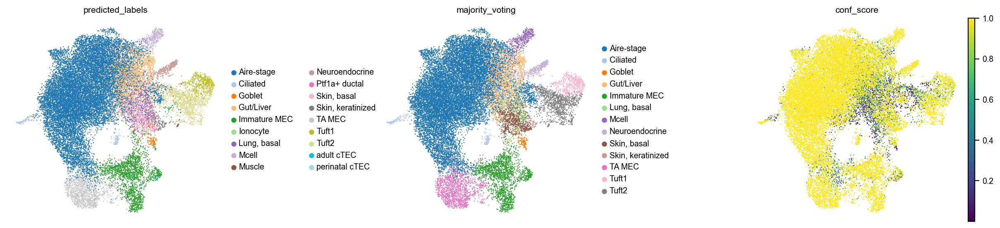

🔬 Input data has 23167 cells and 19238 genes
🔗 Matching reference genes in the model


fezf2


🧬 4432 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 15
🗳️ Majority voting the predictions
✅ Majority voting done!


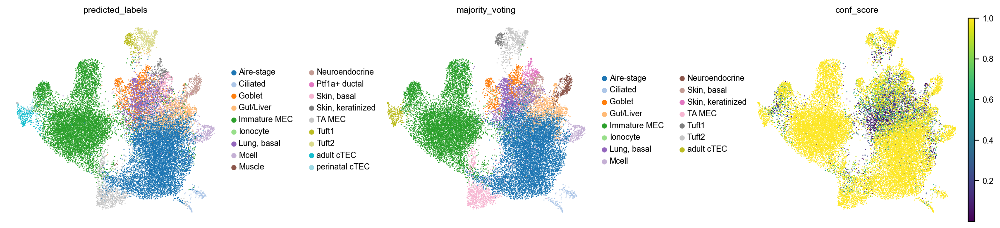

In [39]:
for key,filteredAdata in filteredAdatas.items():
    print(key)
    # Ensure X contains log1p data
    filteredAdata.X = filteredAdata.layers["log1p"].copy()
    # Get celltypist predictions
    predictions = celltypist.annotate(
        filteredAdata,
        model=celltypist_model,
        majority_voting=True
    )
    
    filteredAdata = predictions.to_adata()
    
    sc.pl.umap(
        filteredAdata,
        color=["predicted_labels", "majority_voting", "conf_score"],
        palette=new_tab20,
        s=5,
        wspace=0.55,
    )
    
    filteredAdatas[key] = filteredAdata

# Save data

In [40]:
# Check save paths
if not os.path.isdir(f"{processedDataPath}/Fezf2_thymus_paper/scVI_models/pairwise_processing"):
    os.makedirs(f"{processedDataPath}/Fezf2_thymus_paper/scVI_models/pairwise_processing")

for key,model in models.items():
    if os.path.isdir(f"{processedDataPath}/Fezf2_thymus_paper/scVI_models/pairwise_processing/{key}"):
        shutil.rmtree(f"{processedDataPath}/Fezf2_thymus_paper/scVI_models/pairwise_processing/{key}")
    model.save(f"{processedDataPath}/Fezf2_thymus_paper/scVI_models/pairwise_processing/{key}")

for key,adata in adatas.items():
    adata.write(f"{processedDataPath}/Fezf2_thymus_paper/h5ad_files/pairwise_processing/{key}.h5ad")
for key,filteredAdata in filteredAdatas.items():
    filteredAdata.write(f"{processedDataPath}/Fezf2_thymus_paper/h5ad_files/pairwise_processing/{key}_TECs.h5ad")